# Analyzing Crime in LA

## 🌇🚔 Background

As with any highely populated city, it isn't always glamarous and there can be a large volume of crime. That's where you can help!

You have been asked to support the Los Angeles Police Department (LAPD) by analyzing their crime data to identify patterns in criminal behavior. They plan to use your insights to allocate resources effectively to tackle various crimes in different areas.

You are free to use any methodologies that you like in order to produce your insights. 

# The Data

They have provided you with a single dataset to use. A summary and preview is provided below.

The data is publicly available [here](https://data.lacity.org/Public-Safety/Crime-Data-from-2020-to-Present/2nrs-mtv8).

## 👮‍♀️ crimes.csv

| Column     | Description              |
|------------|--------------------------|
| `'DR_NO'` | Division of Records Number: Official file number made up of a 2 digit year, area ID, and 5 digits. |
| `'Date Rptd'` | Date reported - MM/DD/YYYY. |
| `'DATE OCC'` | Date of occurence - MM/DD/YYYY. |
| `'TIME OCC'` | In 24 hour military time. |
| `'AREA'` | The LAPD has 21 Community Police Stations referred to as Geographic Areas within the department. These Geographic Areas are sequentially numbered from 1-21. |
| `'AREA NAME'` | The 21 Geographic Areas or Patrol Divisions are also given a name designation that references a landmark or the surrounding community that it is responsible for. For example 77th Street Division is located at the intersection of South Broadway and 77th Street, serving neighborhoods in South Los Angeles. |
| `'Rpt Dist No'` | A four-digit code that represents a sub-area within a Geographic Area. All crime records reference the "RD" that it occurred in for statistical comparisons. Find LAPD Reporting Districts on the LA City GeoHub at http://geohub.lacity.org/datasets/c4f83909b81d4786aa8ba8a74ab |
| `'Crm Cd'` | Crime code for the offence committed. |
| `'Crm Cd Desc'` | Definition of the crime. |
| `'Vict Age'` | Victim Age (years) |
| `'Vict Sex'` | Victim's sex: `F`: Female, `M`: Male, `X`: Unknown. |
| `'Vict Descent'` | Victim's descent:<ul><li>`A` - Other Asian</li><li>`B` - Black</li><li>`C` - Chinese</li><li>`D` - Cambodian</li><li>`F` - Filipino</li><li>`G` - Guamanian</li><li>`H` - Hispanic/Latin/Mexican</li><li>`I` - American Indian/Alaskan Native</li><li>`J` - Japanese</li><li>`K` - Korean</li><li>`L` - Laotian</li><li>`O` - Other</li><li>`P` - Pacific Islander</li><li>`S` - Samoan</li><li>`U` - Hawaiian</li><li>`V` - Vietnamese</li><li>`W` - White</li><li>`X` - Unknown</li><li>`Z` - Asian Indian</li> |
| `'Premis Cd'` | Code for the type of structure, vehicle, or location where the crime took place. |
| `'Premis Desc'` | Definition of the `'Premis Cd'`. |
| `'Weapon Used Cd'` | The type of weapon used in the crime. |
| `'Weapon Desc'` | Description of the weapon used (if applicable). |
| `'Status Desc'` | Crime status. |
| `'Crm Cd 1'` | Indicates the crime committed. Crime Code 1 is the primary and most serious one. Crime Code 2, 3, and 4 are respectively less serious offenses. Lower crime class numbers are more serious. |
| `'Crm Cd 2'` | May contain a code for an additional crime, less serious than Crime Code 1. |
| `'Crm Cd 3'` | May contain a code for an additional crime, less serious than Crime Code 1. |
| `'Crm Cd 4'` | May contain a code for an additional crime, less serious than Crime Code 1. |
| `'LOCATION'` | Street address of the crime. |
| `'Cross Street'` | Cross Street of rounded Address |
| `'LAT'` | Latitude of the crime location. |
| `'LON'` | Longtitude of the crime location. |

In [21]:
import pandas as pd
crimes = pd.read_csv("data/crimes.csv")
crimes.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Crm Cd,Crm Cd Desc,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,201223780,2020-11-02,11/02/2020 12:00:00 AM,1120,12,77th Street,1256,210,ROBBERY,65,F,H,102.0,SIDEWALK,204.0,FOLDING KNIFE,Invest Cont,210.0,NaN,NaN,NaN,73RD ST,FIGUEROA ST,33.9737,-118.2827
1,201911283,2020-06-23,06/23/2020 12:00:00 AM,315,19,Mission,1958,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",51,M,O,210.0,RESTAURANT/FAST FOOD,NaN,NaN,Invest Cont,740.0,998.0,NaN,NaN,9700 WOODMAN AV,NaN,34.2467,-118.4479
2,200806654,2020-02-28,02/28/2020 12:00:00 AM,1545,8,West LA,885,420,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),38,F,W,108.0,PARKING LOT,NaN,NaN,Invest Cont,420.0,NaN,NaN,NaN,10400 W PICO BL,NaN,34.0463,-118.4171
3,220912167,2022-08-03,07/26/2022 12:00:00 AM,1730,9,Van Nuys,955,901,VIOLATION OF RESTRAINING ORDER,64,M,H,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,Adult Other,901.0,NaN,NaN,NaN,14200 MAGNOLIA BL,NaN,34.1668,-118.4445
4,200817110,2020-12-02,11/27/2020 12:00:00 AM,1500,8,West LA,802,662,"BUNCO, GRAND THEFT",73,F,W,501.0,SINGLE FAMILY DWELLING,NaN,NaN,Invest Cont,662.0,NaN,NaN,NaN,15000 W SUNSET BL,NaN,34.0889,-118.5325


In [22]:
crimes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400146 entries, 0 to 400145
Data columns (total 25 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           400146 non-null  int64  
 1   Date Rptd       400146 non-null  object 
 2   DATE OCC        400146 non-null  object 
 3   TIME OCC        400146 non-null  int64  
 4   AREA            400146 non-null  int64  
 5   AREA NAME       400146 non-null  object 
 6   Rpt Dist No     400146 non-null  int64  
 7   Crm Cd          400146 non-null  int64  
 8   Crm Cd Desc     400146 non-null  object 
 9   Vict Age        400146 non-null  int64  
 10  Vict Sex        346271 non-null  object 
 11  Vict Descent    346268 non-null  object 
 12  Premis Cd       400140 non-null  float64
 13  Premis Desc     399910 non-null  object 
 14  Weapon Used Cd  136027 non-null  float64
 15  Weapon Desc     136027 non-null  object 
 16  Status Desc     400146 non-null  object 
 17  Crm Cd 1  

## 💪 The Challenge

* Use your skills to produce insights about crimes in Los Angeles.
* Examples could include examining how crime varies by area, crime type, victim age, time of day, and victim descent.
* You could build machine learning models to predict criminal activities, such as when a crime may occur, what type of crime, or where, based on features in the dataset.
* You may also wish to visualize the distribution of crimes on a map.

# Explanatory Data Analysis

## Data Cleaning and Validation
Data received as described structured in 25 columns and over 400K rows., the following modification have been made:
1.	Columns ‘Date Rpt’ and ‘ATE OCC’ are of ‘object’ data type so it was converted to ‘datetime’ format.
2.	Missing values analyzing exposed 9 columns with missing values, the following imputation and dropping process have been made:
    -	Columns ‘Premis Cd’ and ‘Crm Cd 1’ have only 6 random missing values, so the rows with missing values were dropped.
    -	Column ‘Vict Sex’ and ‘Vict Descent’ contain 53875, which equals 13.5% of the total observations, totally not at random    missing values, it’s also noticeable that the missing values all accompanied with 0 in the ‘Vict Age’ column and only 2 types of crimes VEHICLE – STOLEN and THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER). So no simple presumptions can be done, and the missing values in Column ‘Vict Sex’ and ‘Vict Descent’ were impyted with ‘X’ for ‘Unknown’.
    -	Column ‘Weapon Used Cd’ and ‘Weapon Desc’ contain 264119, which equals 66% of the total observations, totally not at random missing values. Here also no simple presumptions can be done. So a new category ‘Unknown’ was created for ‘Weapon Desc’ and 0 is it’s code in ‘Weapon Used Cd’. This will cause a serious imbalance to the data but the value 0 shall create a big variance with other codes which might refer to a certain pattern. 
    -	Column ‘Premis Desc’ contain 236 missing values, imputed with their corresponding values of the column ‘Premis Cd’ and converted to ‘text’.
    -	Columns 'Crm Cd 2', 'Crm Cd 3' and 'Crm Cd 4' contains huge number of missing values range from 93% and 100% of the total number of observations, imputed all with 0.
    -	Column ‘Cross Street’ contains 335564 missing values equals 84% of the total observations, we can assume that the location is NOT at Cross Street of rounded Address. So I decided to impute the missing values with the most frequent value ‘No’.
3.	The inconsistent value ‘H’ in the column ‘'Vict Sex'’ was imputed as ‘X’ for ‘Unknown’.
4.	Column ‘'Vict Age' contained 1 value as 120, 2 values as -2 and 30 values as -1 replaced with 12, 2 and 1 respectively.
5.	‘Vict Age’ column contains values ranges from 0 to 99. A new column ‘Vict_age_cat’ was created to categorize the age as per the following: 
    - **Child:** 0 to 12 
    - **Teen:** 13 to 18
    - **Young Adult:** 19 to 35
    - **Adult:** 36 to 67
    - **Senior:** Greater than 67
6.	the following new column has been created from ‘Date_Occ’ column:
    **- ‘year_month’:** has the date rounded to year and month
    **- ‘date_occ_year’:** contains the value of the years only 
    **- ‘date_occ_month’:** contains the value of the months only
    **- ‘date_occ_day’:** contains the value of the day only
    **- 'weekday_name':** contains the names of the days

In [23]:
pip install adjustText

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [24]:
# Importing Packages
import numpy as np
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
from adjustText import adjust_text

In [25]:
def null_analysis(df):
    """
    Analyze null values in a DataFrame.

    Parameters:
        df (pd.DataFrame): Input dataframe for analysis.

    Returns:
        pd.DataFrame: DataFrame containing columns' names, number of null values,
                      and the ratio of null values to the total length of the dataframe.
    """
    # Count of null values for each column
    null_count = df.isna().sum()

    # Ratio of null values to the total length for each column
    null_ratio = null_count / len(df)

    # Creating the result dataframe
    result = pd.DataFrame({
        'Column Name': null_count.index,
        'Null Values Count': null_count.values,
        'Null Ratio': null_ratio.values.round(3)
    })

    return result
null_analysis(crimes)

,Column Name,Null Values Count,Null Ratio
0,DR_NO,0,0.000
1,Date Rptd,0,0.000
2,DATE OCC,0,0.000
3,TIME OCC,0,0.000
4,AREA,0,0.000
5,AREA NAME,0,0.000
6,Rpt Dist No,0,0.000
7,Crm Cd,0,0.000
8,Crm Cd Desc,0,0.000
9,Vict Age,0,0.000


In [26]:
# Drop rows where 'Premis Cd' & 'Crm Cd 1' is NaN
crimes.dropna(subset=['Premis Cd', 'Crm Cd 1'], inplace=True)

# Recreating the dictionary for imputation
impute_values = {
    'Vict Sex': 'X',
    'Vict Descent': 'X',
    'Weapon Used Cd': 0,
    'Weapon Desc': 'Unknown',
    'Crm Cd 1': 0,
    'Crm Cd 2': 0,
    'Crm Cd 3': 0,
    'Crm Cd 4': 0,
    'Cross Street': 'No'
}
# Replacing NaN in 'Premis Desc' with corresponding 'Premis Cd' values converted to string
crimes['Premis Desc'].fillna(crimes['Premis Cd'].astype(str), inplace=True)

# Applying the imputations based on the dictionary
crimes.fillna(value=impute_values, inplace=True)

# Asserting that crimes contains no missing values
assert crimes.isna().sum().sum() == 0

# Cleaninf 'Vict Sex' by changing 'H' values to 'X'
crimes.loc[crimes['Vict Sex'] == 'H', 'Vict Sex'] = 'X'

# Cleaning 'Vict Age'column by converting negative values to positive and replace 120 with 12
crimes['Vict Age'] = crimes['Vict Age'].abs()  
crimes.loc[crimes['Vict Age'] == 120, 'Vict Age'] = 12  

# Change to dateformat
date_time= ['Date Rptd', 'DATE OCC']
for i in date_time:
    crimes[i]=pd.to_datetime(crimes[i])

In [27]:
crimes.describe()

,DR_NO,TIME OCC,AREA,Rpt Dist No,Crm Cd,Vict Age,Premis Cd,Weapon Used Cd,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LAT,LON
count,4.001340e+05,400134.000000,400134.000000,400134.000000,400134.000000,400134.000000,400134.000000,400134.000000,400134.000000,400134.000000,400134.000000,400134.0,400134.000000,400134.000000
mean,2.148029e+08,1337.733144,10.713306,1117.736718,493.342320,30.134950,301.462265,122.631566,493.151099,67.489663,1.957729,0.0,33.969530,-117.992458
std,1.028652e+07,653.030041,6.092224,609.226022,200.734212,21.855775,216.047824,186.035934,200.565863,247.300214,43.867318,0.0,1.883388,6.531412
min,2.113000e+03,1.000000,1.000000,101.000000,110.000000,0.000000,101.000000,0.000000,110.000000,0.000000,0.000000,0.0,0.000000,-118.667600
25%,2.021122e+08,900.000000,6.000000,622.000000,330.000000,4.000000,101.000000,0.000000,330.000000,0.000000,0.000000,0.0,34.014000,-118.429400
50%,2.119114e+08,1420.000000,11.000000,1141.000000,442.000000,31.000000,203.000000,0.000000,442.000000,0.000000,0.000000,0.0,34.058500,-118.321300
75%,2.215050e+08,1900.000000,16.000000,1617.000000,626.000000,45.000000,501.000000,311.000000,626.000000,0.000000,0.000000,0.0,34.163000,-118.273900
max,2.399165e+08,2359.000000,21.000000,2198.000000,954.000000,99.000000,972.000000,516.000000,954.000000,999.000000,999.000000,0.0,34.334300,0.000000


In [28]:
crimes.describe(include= 'object')

,AREA NAME,Crm Cd Desc,Vict Sex,Vict Descent,Premis Desc,Weapon Desc,Status Desc,LOCATION,Cross Street
count,400134,400134,400134,400134,400134,400134,400134,400134,400134
unique,21,112,3,20,305,78,6,53316,7254
top,Central,VEHICLE - STOLEN,M,H,STREET,Unknown,Invest Cont,800 N ALAMEDA ST,No
freq,26992,44157,168305,120774,102857,264110,322948,768,335556


In [29]:
# Categorizing 'Vict age'
# Defining the age bins
bins = [0, 12, 19, 35, 68, float('inf')]

# Labels for the age categories
labels = ['Child', 'Teen', 'Young Adult', 'Adult', 'Senior']

# Creating the 'Vict_age_cat' column
crimes['Vict_age_cat'] = pd.cut(crimes['Vict Age'], bins=bins, labels=labels, right=True, include_lowest=True)

# Creating a new columns from 'Date Occ'
crimes['year_month'] = crimes['DATE OCC'].dt.strftime('%Y-%m')
crimes['date_occ_year'] = crimes['DATE OCC'].dt.year
crimes['date_occ_month'] = crimes['DATE OCC'].dt.month
crimes['date_occ_day'] = crimes['DATE OCC'].dt.day
# Extract the day of the week name
crimes['weekday_name'] = crimes['DATE OCC'].dt.day_name()

# Convert object type to category for memory aspects
crimes[crimes.select_dtypes('object').columns] = crimes.select_dtypes('object').astype('category')
# Create a new file to save the changes
crimes.to_csv('crimes_clean.csv', index= None)

## Visualization
### Total Number of Crimes per Time
The line plot illustrates the total number of crimes over time in Los Angeles. There seem to be some fluctuations and potentially some trends or patterns that could be worth exploring further, for example the data starts with a notable decrease in number of crimes might have been caused by the pandemic. moreover, we can notice the number of crimes repetitively decreases in Abril and increases in July.

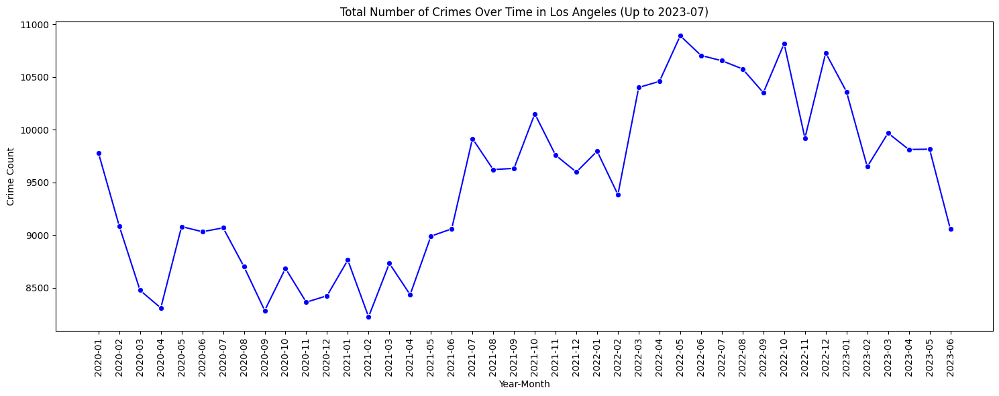

In [30]:
# Load the data
crimes_clean = pd.read_csv('crimes_clean.csv')

# Group by 'year_month' and count the number of crimes in each month
crime_over_time = crimes_clean['year_month'].value_counts().sort_index().reset_index()
crime_over_time.columns = ['Year-Month', 'Crime Count']

# Filter the DataFrame to include only dates before '2023-07'
crime_over_time = crime_over_time[crime_over_time['Year-Month'] < '2023-07']

# Visualize the trend of crimes over time
plt.figure(figsize=(15, 6))
sns.lineplot(x='Year-Month', y='Crime Count', data=crime_over_time, marker='o', color='b')
plt.title('Total Number of Crimes Over Time in Los Angeles (Up to 2023-07)')
plt.xlabel('Year-Month')
plt.ylabel('Crime Count')
plt.xticks(rotation=90)
plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlapping
plt.show()

### Frequency of Top 10 Crime Types by Area in Los Angeles
The heatmap provides a detailed view of how the top 10 crime types are distributed across different areas in Los Angeles. The color intensity indicates the frequency of each crime type within an area, allowing us to quickly identify which crimes are most prevalent in which areas. This kind of visualization can be particularly useful for law enforcement to target specific crime types in areas where they are most common.

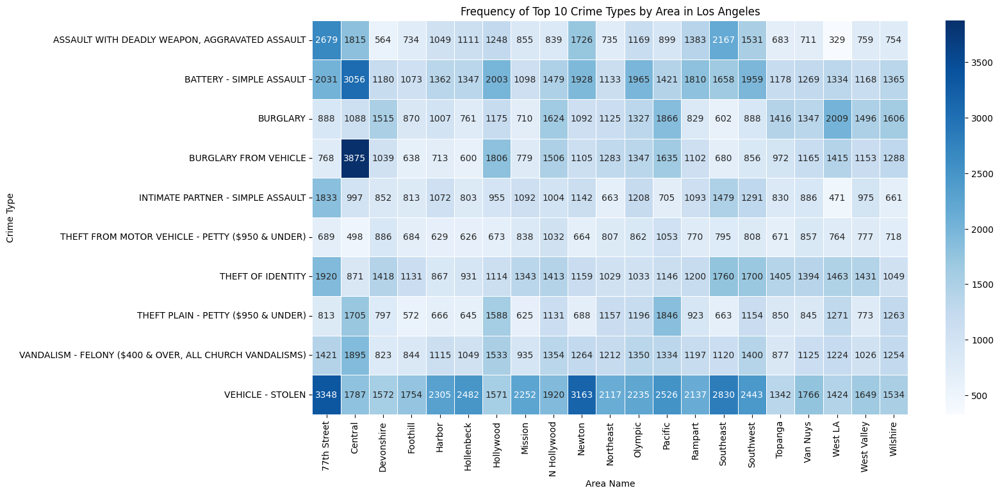

In [31]:
# Group by 'Crm Cd Desc' (crime description) and count the number of each type of crime
crime_type_counts = crimes_clean['Crm Cd Desc'].value_counts().nlargest(10).reset_index()
crime_type_counts.columns = ['Crime Type', 'Count']

# Filter the dataset for the top 10 crime types
top_crimes = crime_type_counts['Crime Type'].tolist()
top_crimes_data = crimes_clean[crimes_clean['Crm Cd Desc'].isin(top_crimes)]

# Create a pivot table for the heatmap
crime_type_area_pivot = top_crimes_data.pivot_table(index='Crm Cd Desc', columns='AREA NAME', aggfunc='size', fill_value=0)

# Adjusting the heatmap with a sequential color palette
plt.figure(figsize=(15, 8))
sns.heatmap(crime_type_area_pivot, annot=True, fmt="d", cmap='Blues', linewidths=.5)
plt.title('Frequency of Top 10 Crime Types by Area in Los Angeles')
plt.xlabel('Area Name')
plt.ylabel('Crime Type')
plt.xticks(rotation=90)
plt.show()

### Top 10 Most Common Crime Types in Los Angeles
This visualization provides a clear picture of which types of crimes are most frequently reported. Understanding the prevalence of different crime types can help in prioritizing and strategizing crime prevention and response efforts.

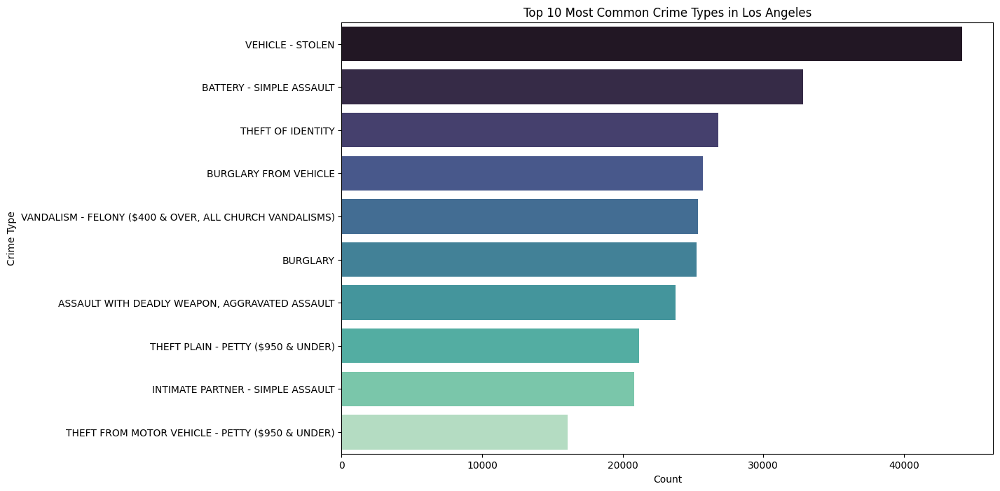

In [32]:
# Let's visualize the most common crime types
plt.figure(figsize=(12, 8))
sns.barplot(x='Count', y='Crime Type', data=crime_type_counts, palette='mako')
plt.title('Top 10 Most Common Crime Types in Los Angeles')
plt.xlabel('Count')
plt.ylabel('Crime Type')
plt.show()

### Trends of Top 10 Crime Types Over Time in Los Angeles
The line plot illustrates the trends of the top 10 crime types over time in Los Angeles. Each line represents the frequency of a specific crime type from month to month. This visualization helps us identify patterns, such as increases or decreases in crime rates, and any seasonal trends or anomalies.

From the plot, we can observe that some crime types show clear trends, while others fluctuate more randomly. This kind of analysis can be particularly insightful for predicting future crime rates and understanding the effectiveness of law enforcement strategies over time.

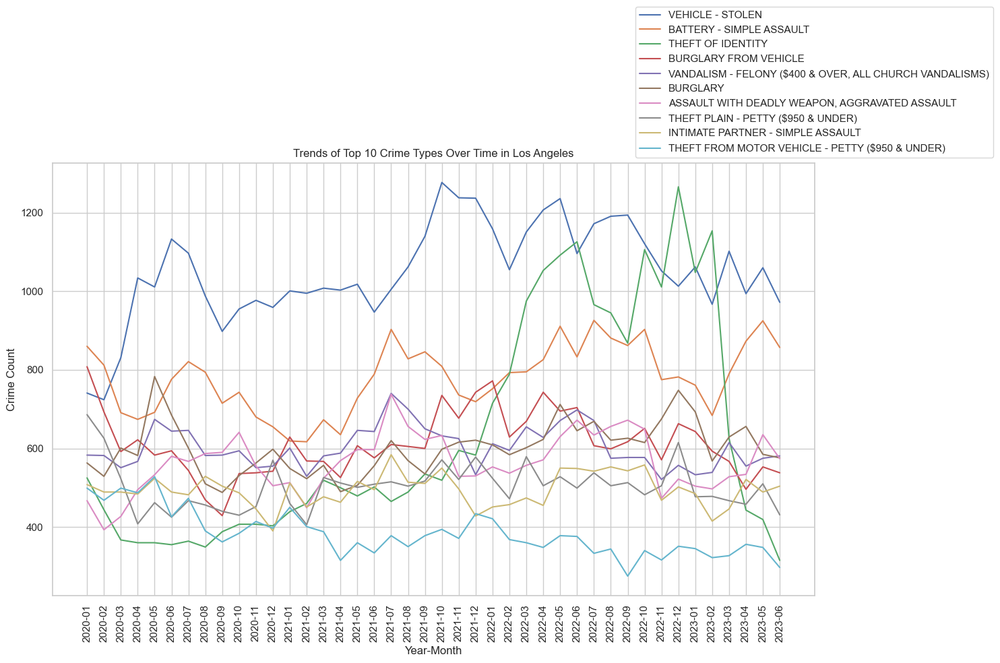

In [33]:
# Create a dataframe for time series analysis of the top crime types
top_crimes_time_data = top_crimes_data.groupby(['year_month', 'Crm Cd Desc']).size().unstack(fill_value=0)

# Filter the DataFrame to include only dates before '2023-07'
top_crimes_time_data = top_crimes_time_data[top_crimes_time_data.index < '2023-07']

plt.figure(figsize=(15, 10))
sns.set(style="whitegrid")

for crime in top_crimes:
    sns.lineplot(x=top_crimes_time_data.index, y=top_crimes_time_data[crime], label=crime)

plt.title('Trends of Top 10 Crime Types Over Time in Los Angeles')
plt.xlabel('Year-Month')
plt.ylabel('Crime Count')
plt.xticks(rotation=90)
plt.legend(loc='lower center', bbox_to_anchor=(1,1)) 
plt.tight_layout()  
plt.show()

### Number of Crimes by Victim's Sex and Age Category
This bar chart depicts the "Number of Crimes by Victim's Sex & Age Category." Here's a breakdown of the observed trends:
- Child: Female children (F) are victimized less frequently than male children (M). There's an almost negligible representation for 'X' (which could possibly denote 'Other' or 'Not Specified') in this age group.
- Teen: Male teenagers appear to be the primary targets, with their count being significantly higher than that of female teenagers. Once again, 'X' is minimally represented.
- Young Adult: Young adult females face slightly more crimes than young adult males, but the numbers are quite close. The 'X' category sees a small increase but remains comparatively low.
- Adult: Adult males are more often victims of crimes compared to adult females. The 'X' category remains minimal but slightly more than the previous age groups.
- Senior: Female seniors are victimized less frequently than male seniors. The 'X' category remains relatively low in this age bracket.
- Overall: Males are more frequently victims in the "Child", "Teen", and "Adult" categories. Whilst, Females surpass males in the "Young Adult" category but are less victimized in the other age groups. And the 'X' category which stands for “Unknown” consistently has the least number of crimes across all age groups but sees slight increases as the age group progresses.
- In essence, the distribution of crimes varies based on both gender and age. While males in certain age groups face more crimes, young adult females seem to be an exception. 


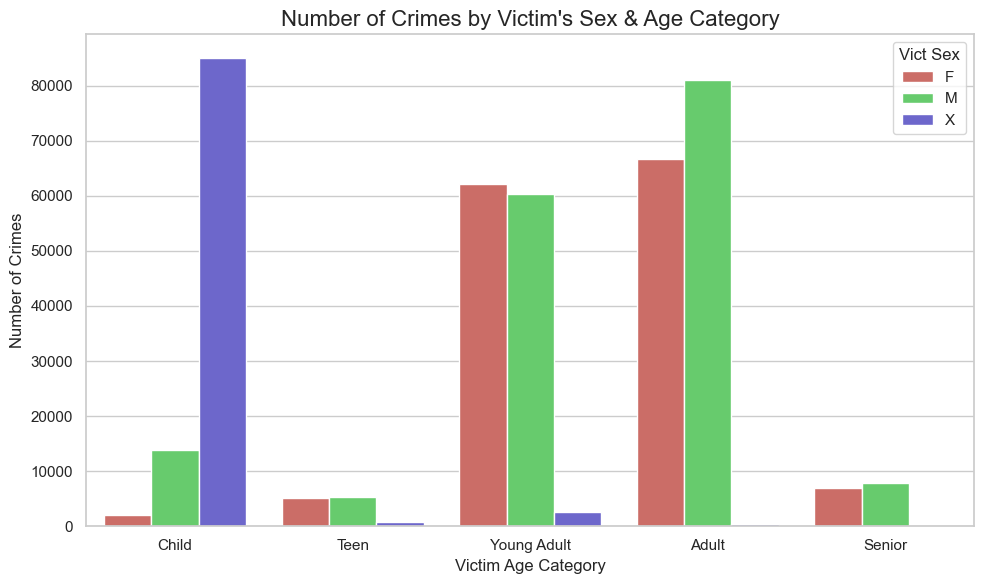

In [34]:
# Setting the figure size for better visualization
plt.figure(figsize=(10, 6))

# Countplot to visualize the distribution of crimes by victim age category
sns.countplot(data=crimes, x='Vict_age_cat', order=['Child', 'Teen', 'Young Adult', 'Adult', 'Senior'], hue='Vict Sex', palette= 'hls')
plt.title("Number of Crimes by Victim's Sex & Age Category", fontsize=16)
plt.ylabel('Number of Crimes')
plt.xlabel('Victim Age Category')

plt.tight_layout()
#plt.savefig('Crimes by Sex & Age.jpg', bbox_inches='tight')
plt.show()

### Mapping Crimes by Area in Los Angeles
This map showcases the number of crimes by area. "Central" has the highest crime count, noticeably exceeding 25,000. "77th Street" and "Pacific" follow, with numbers slightly above 20,000. Most areas, like "Southwest", "Hollywood", and "Southeast", have crime counts clustered around 15,000 to 20,000. The areas from "Wilshire" to "Topanga" exhibit more uniformity, with counts close to 15,000. "Hollenbeck" and "Foothill" at the end have noticeably lower crime rates, below 10,000. In summary, while "Central" stands out with the highest crime incidents, there's a general decrease as we move rightwards, with a few areas showing significant deviations.

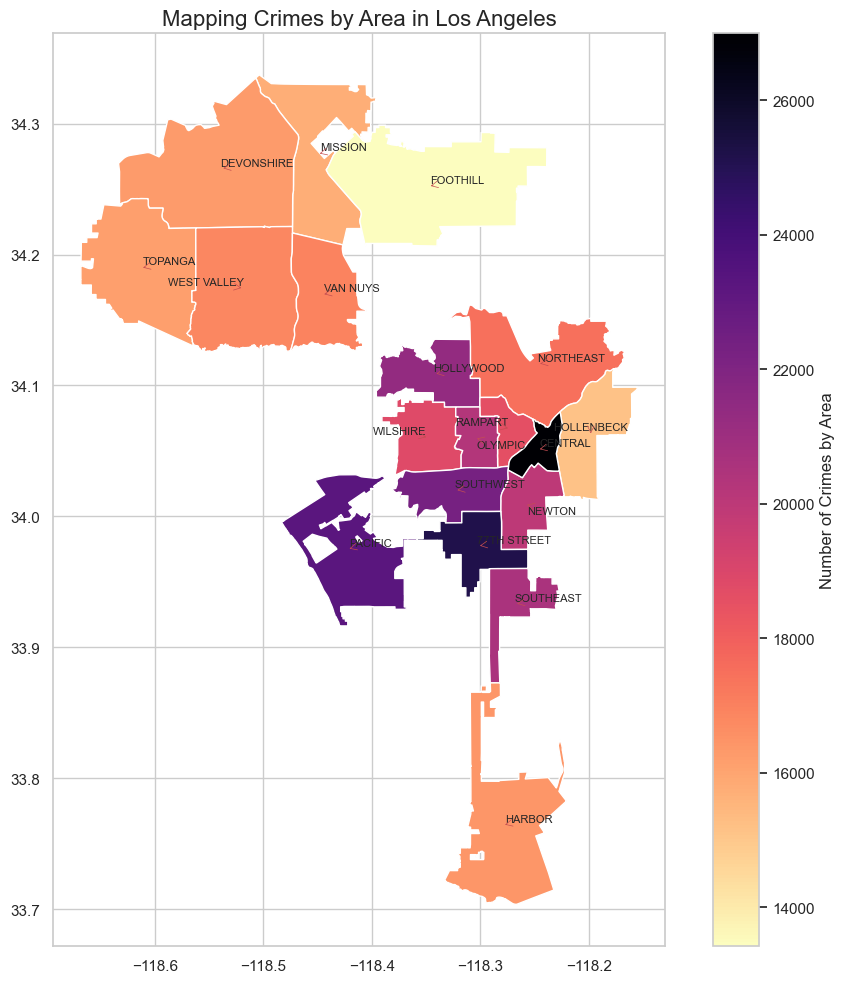

In [35]:
# Load the GeoJSON data into a GeoDataFrame
url = "https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LAPD_Division/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson"
gdf = gpd.read_file(url)

# Aggregate number of crimes by area
crime_counts = crimes.groupby('AREA NAME').size().reset_index(name='crime_count')
# Convert 'AREA NAME' to uppercase to match 'APREC'
crime_counts['AREA NAME'] = crime_counts['AREA NAME'].str.upper()

# Merge the GeoDataFrame with crime counts
gdf_merged = gdf.merge(crime_counts, left_on='APREC', right_on='AREA NAME')

fig, ax = plt.subplots(figsize=(10, 10))
ax.set_aspect('equal')  # Setting aspect ratio

gdf_merged.plot(column='crime_count', ax=ax, legend=True, cmap='magma_r',
                legend_kwds={'label': "Number of Crimes by Area"})

# Instead of annotating directly, gather all texts in a list
texts = []
for x, y, label in zip(gdf_merged.geometry.centroid.x, gdf_merged.geometry.centroid.y, gdf_merged['APREC']):
    texts.append(ax.text(x, y, label, fontsize=8))

# Use adjust_text to optimize text positions
adjust_text(texts, only_move={'points':'y', 'texts':'y'}, arrowprops=dict(arrowstyle="->", color='r', lw=0.5))

plt.title('Mapping Crimes by Area in Los Angeles', fontsize=16)
plt.tight_layout()
#plt.savefig('Mapping Crimes by Area.jpg', bbox_inches='tight')
plt.show()

### Number of Crimes by Day of the Week
The chart shows the "Number of Crimes by Day of the Week." Crimes are fairly consistent daily, with slight peaks on Saturday and a modest dip on Sunday. This uniformity suggests crimes occur regularly, irrespective of the day. Further investigation might reveal factors influencing this near-even distribution.

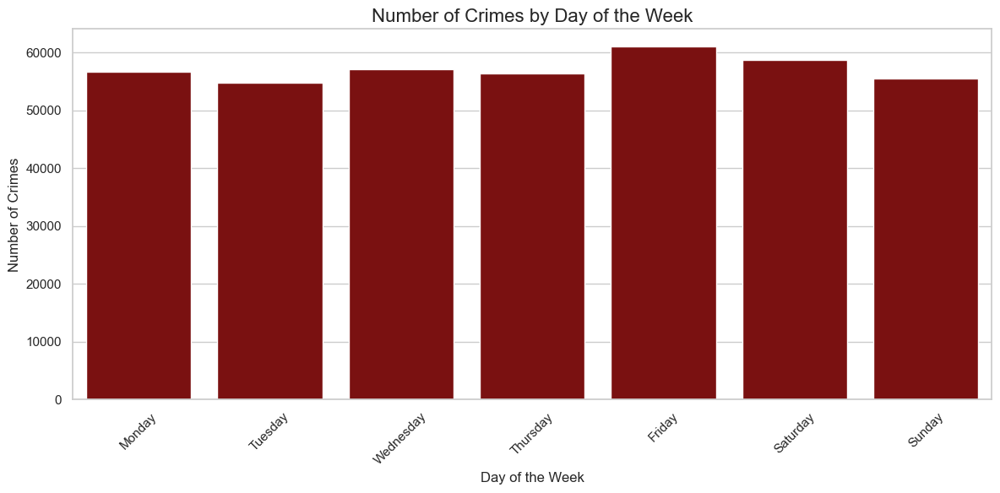

In [36]:
# Group by the day of the week and count the number of crimes
weekday_counts = crimes.groupby('weekday_name').size().reset_index(name='crime_count')

# Order the days for proper plotting
order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_counts = weekday_counts.set_index('weekday_name').loc[order].reset_index()

# Visualize using a bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x='weekday_name', y='crime_count', data=weekday_counts, color= 'darkred', order= order)
plt.title('Number of Crimes by Day of the Week', fontsize=16)
plt.ylabel('Number of Crimes')
plt.xlabel('Day of the Week')
plt.xticks(rotation=45)
plt.tight_layout()
#plt.savefig('Crimes by Day.jpg', bbox_inches='tight')
plt.show()

### Distribution of Crimes by Hour of the Day
The chart depicts "Distribution of Crimes by Hour of the Day." Crime occurrences dip in the early hours, rise steadily through the morning, peak around midday, then maintain a high plateau in the afternoon and evening. 

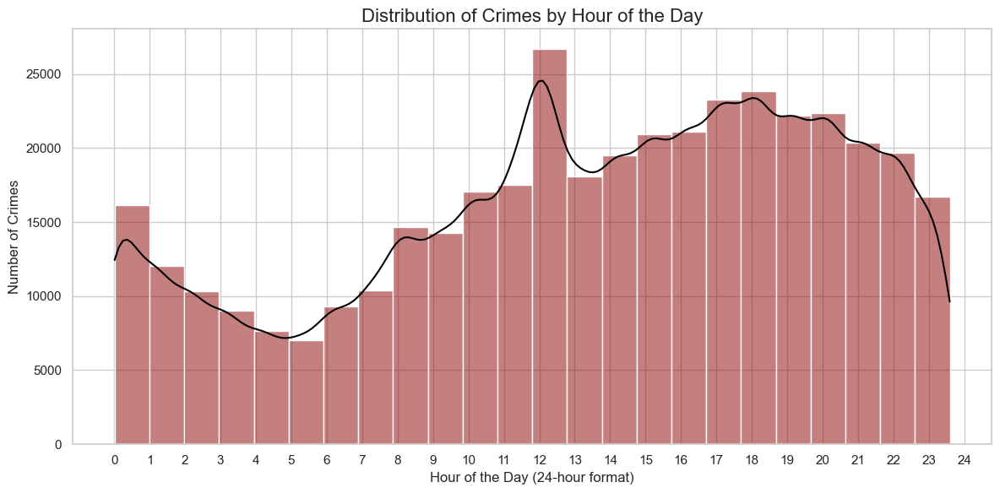

In [37]:
plt.figure(figsize=(12, 6))

# Extracting the hour from the 'TIME OCC' column
crimes['hour'] = crimes['TIME OCC'] / 100

# Plotting the histogram
sns.histplot(crimes['hour'], bins=24, kde=True, color='darkred').lines[0].set_color('black')

plt.title('Distribution of Crimes by Hour of the Day', fontsize=16)
plt.xlabel('Hour of the Day (24-hour format)')
plt.ylabel('Number of Crimes')
plt.xticks(range(0, 25))
plt.tight_layout()
#plt.savefig('Crimes by Hour.jpg', bbox_inches='tight')
plt.show()

# Feature Engineering

### Objective and Challenges of the Analysis
The primary objective of this analysis is to enhance the Los Angeles Police Department's (LAPD) resource allocation efficiency. The dataset presents unique challenges: it is multi-label, multiclass, and exhibits significant imbalance. These characteristics complicate the task of predicting crime types, locations, and timings using standard supervised machine learning models, either classification or regression.

### Rationale for Clustering

Given these challenges, we pivot towards a clustering approach. Clustering is advantageous in this context as it condenses a vast dataset into discernible groups, with each cluster encapsulating distinct characteristics of its members. This method not only simplifies the data but also unveils inherent groupings, patterns, and relationships that are not immediately obvious, providing valuable insights for strategic planning and decision-making.

### Reducing Imbalance in Crime Types

Before delving into clustering, we address the dataset's imbalance, particularly in crime types. Setting a threshold of an average of 3 crimes per day over the span of 42 months (January 2020 to July 2023), we focus on crime types with a frequency of at least 3,800 occurrences. This filtration retains about 89% of total reported crimes but narrows down the crime types from 112 to the top 20. This significant reduction in crime type categories simplifies the dataset while still capturing the majority of crime instances.

### Data Transformation for Analysis

To further refine our dataset for analysis:

**Time Categorization:** We categorize the time of day into three segments: ‘morning’ (6 AM to 1:59 PM), ‘evening’ (2 PM to 9:59 PM), and ‘night’ (10:00 PM to 5:59 AM). This categorization aims to simplify the analysis of crime trends over different times of the day.

**Victim Age Grouping:** Initially, missing victim age data were imputed as zeros, assuming these cases involved minors. For this analysis, we categorize victim ages into two groups: ‘minor’ and ‘adult’ to facilitate a more streamlined examination of victim demographics.

**Data Pruning:** We will drop descriptive text and numeric columns that have been recategorized. Additionally, to reduce multicollinearity, we will remove one column from each pair of highly correlated variables.

### One-Hot Encoding:
Finally, we apply one-hot encoding to categorical text columns, transforming them into a numerical format suitable for machine learning algorithms.

In [38]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, MinMaxScaler, StandardScaler, MaxAbsScaler
from sklearn.feature_selection import SelectKBest, f_classif
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedShuffleSplit, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, log_loss, confusion_matrix
from sklearn.ensemble import RandomForestClassifier

In [39]:
crimes_clean= pd.read_csv('crimes_clean.csv')
object_cols = crimes_clean.select_dtypes(include=['object']).columns
crimes_clean[object_cols] = crimes_clean[object_cols].astype('category')
crimes_clean.info()
crimes_clean.to_csv('crimes_clean.csv', index= None)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400134 entries, 0 to 400133
Data columns (total 31 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   DR_NO           400134 non-null  int64   
 1   Date Rptd       400134 non-null  category
 2   DATE OCC        400134 non-null  category
 3   TIME OCC        400134 non-null  int64   
 4   AREA            400134 non-null  int64   
 5   AREA NAME       400134 non-null  category
 6   Rpt Dist No     400134 non-null  int64   
 7   Crm Cd          400134 non-null  int64   
 8   Crm Cd Desc     400134 non-null  category
 9   Vict Age        400134 non-null  int64   
 10  Vict Sex        400134 non-null  category
 11  Vict Descent    400134 non-null  category
 12  Premis Cd       400134 non-null  float64 
 13  Premis Desc     400134 non-null  category
 14  Weapon Used Cd  400134 non-null  float64 
 15  Weapon Desc     400134 non-null  category
 16  Status Desc     400134 non-null  categ

In [40]:
# Standardize the column names
df= crimes_clean.copy()
df.columns = df.columns.str.lower().str.replace(' ', '_')

# Calculate the frequency of each value in 'col1'
frequency = df['crm_cd'].value_counts()

# Filter the DataFrame to keep only those rows where the frequency is 3800 or more
df_reduced = df[df['crm_cd'].map(frequency) >= 3800]

def categorize_time(time):
    if 600 <= time < 1200:
        return 'morning'
    elif 1200 <= time < 2200:
        return 'evening'
    else:
        return 'night'

# Apply the function to the 'time_occ' column
df_reduced['time_category'] = df_reduced['time_occ'].apply(categorize_time)

# Categorizing vict_age_cat
df_reduced['vict_age_cat']= df_reduced['vict_age'].apply(lambda x: 'adult' if x >= 18 else 'minor')

In [41]:
final_df= df_reduced.copy()

columns_to_drop = [
    'time_occ', # Categorised in 'time_category'
    'vict_age', # Categorised in 'vict_age_cat'
    'dr_no', # Indescibtive identifier 
    'date_rptd', 'date_occ', 'year_month', 'weekday_name', # Date related columns
    'area_name', # Redundant with 'area'
    'crm_cd_desc', # Redundant with 'crm_cd'
    'premis_desc', # Redundant with 'premis_cd'
    'weapon_desc', # Redundant with 'weapon_used_cd'
    'crm_cd_1', 'crm_cd_2', 'crm_cd_3', 'crm_cd_4', # Redundant with 'crm_cd'
    'location', 'cross_street', 'lat', 'rpt_dist_no' # Redundant with 'area', 'premis_cd' and 'lon'
    ]

# Drop the columns in the new dataframe
df_reduced = df_reduced.drop(columns=columns_to_drop)

In [42]:
# Create function to one-hot encoding categorical text columns
def one_hot_encode(df):
    # Creating the OneHotEncoder object with sparse matrix
    ohe = OneHotEncoder(sparse=True, handle_unknown='ignore')
    
    # List of categorical columns to one-hot encode
    categorical_cols = ['status_desc', 'vict_sex', 'vict_descent',
                        'vict_age_cat', 'time_category']
    
    # Applying the encoder and keeping the transformed data in a sparse matrix format
    encoded_columns = ohe.fit_transform(df[categorical_cols])
    
    # Drop the original categorical columns
    df.drop(categorical_cols, axis=1, inplace=True)
    
    # Converting the sparse matrix to a DataFrame with appropriate column names
    # This step is memory-intensive but is required to create the final DataFrame
    encoded_columns_df = pd.DataFrame.sparse.from_spmatrix(encoded_columns, 
                                                           columns=ohe.get_feature_names_out(categorical_cols))
    
    # Resetting index on our original data to avoid index mismatch after concatenation
    df.reset_index(drop=True, inplace=True)
    
    # Concatenating the original data with the new one-hot encoded columns
    df_reduced_encoded = pd.concat([df, encoded_columns_df], axis=1)
    
    return df_reduced_encoded

# Apply the adjusted function to our dataset
df_reduced_encoded = one_hot_encode(df_reduced)

# Display the shape of the final DataFrame
df_reduced_encoded.shape

(356686, 41)

# Preprocessing and Modeling
### OPTICS for Clustering

The OPTICS (Ordering Points to Identify the Clustering Structure) algorithm stands out as a robust tool in the realm of machine learning for handling large and complex datasets. Its proficiency in managing varied densities and adeptness at outlier detection aligns well with real-world data complexities. This makes OPTICS an invaluable asset for uncovering hidden structures within intricate datasets.

One critical aspect of leveraging OPTICS, as with most unsupervised learning methods, lies in the interpretation of its results. This process often entails iterative refinement of model parameters to gain deeper insights into the data's inherent patterns. An important consideration in preparing data for OPTICS is its sensitivity to feature scaling.

Given the non-Gaussian distribution of our dataset and the presence of features across different scales, Min-Max scaling (normalization) emerges as a strategic choice. This scaling technique transforms the data to a common range, typically between 0 and 1, thereby aligning all features onto a uniform scale. Such uniformity is particularly beneficial for distance-based algorithms like OPTICS, enhancing their ability to discern and cluster data points effectively.

However, it's crucial to acknowledge that OPTICS can be computationally intensive. Given this significant investment in computational resources, a best practice is to apply the dimensionality reduction technique PCA (Principal Component Analysis), which outputs clearly that we can reduce the dimensions of the data to its first 3 principal components. And for further preservations of computational resources, we shall maintain the resulting labels, reachability, and ordering outputs. Saving these attributes into separate files not only conserves computational efforts for future analyses but also facilitates a more efficient exploration of the clustering results.

### PCA Analysis:
The bar chart illustrating the result of PCA analysis clearly indicate that we have 3 principal components. 

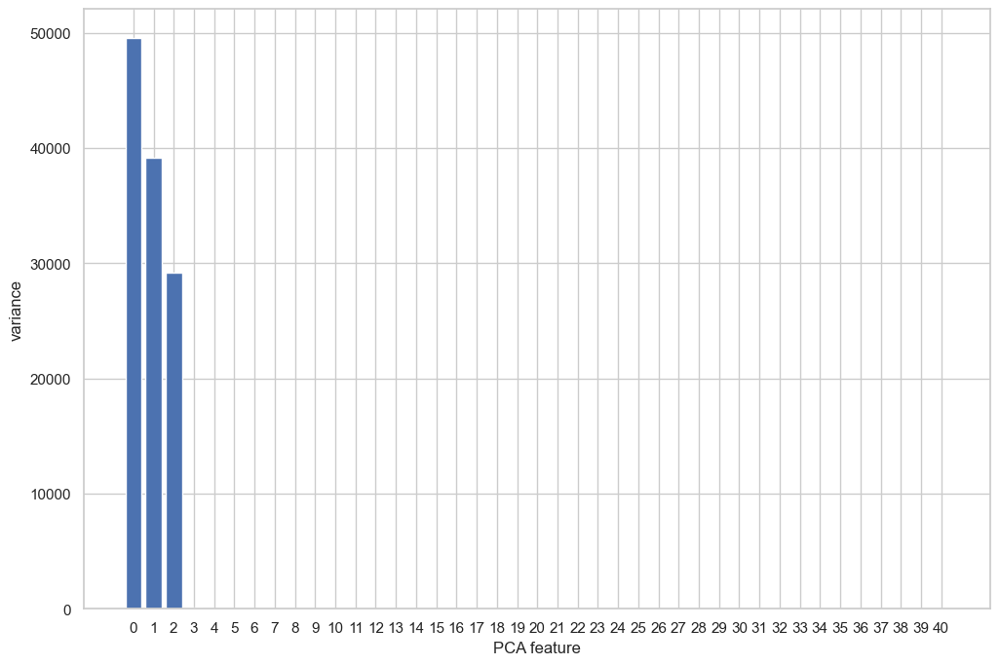

In [43]:
# Create a MinMaxScaler object
scaler = MinMaxScaler()

# Apply the scaler to the DataFrame
df_scaled = scaler.fit_transform(df_reduced_encoded)

from sklearn.decomposition import PCA
pca = PCA()
pca.fit(df_reduced_encoded)
features = range(pca.n_components_)
plt.figure(figsize=(12, 8))
plt.bar(features, pca.explained_variance_)
plt.xticks(features)
plt.ylabel('variance')
plt.xlabel('PCA feature')
plt.show()

### Applying and Evaluating the Clustering Model:
OPTICS was applied to the data, and the following baisic results can be identified:
- Number of points labeled as '-1' (noise): 59376
- Ratio of Niose to Original Data: 0.16646574297841799
- Number of unique labels Excluding Noise: 9
Additionally, a reachability plot is used to illustrate the results.
1. What is a reachability plot?: Each small graph represents a "reachability plot," which is a way to show how close data points are to each other. Think of it as measuring the distance between each house in a neighborhood. If houses are close together, they're part of the same neighborhood (or cluster). If there's a large space between houses, it means you're moving into a different neighborhood.
2. Clusters and Noise: Each plot is color-coded for a different cluster, which represents a group of data points that are similar to each other. The black plot at the bottom right represents 'noise', which means data points that didn't fit well into any other group.

3. Understanding the Structure:
- Valley Depth: The vertical axis shows the 'reachability distance,' which is like the space between houses. A lower value means houses are closer together. Deep valleys (where the reachability distance is low) suggest a dense cluster, where many points are close to each other.
- Valley Width: The horizontal width of the valleys indicates how many points are in that cluster. Wider valleys suggest a larger neighborhood with more houses.
- Spikes: Sudden spikes (sharp rises in the plot) suggest a point is farther away from its neighbors, like a house that's set apart from others.
4. Reading the Plots:
        Cluster 0: The first plot, for example, shows a relatively uniform neighborhood with most houses (data points) being at a similar distance from each other.
        Cluster -1: The last plot (labeled as Cluster -1) is full of noise; it's like a rural area where houses are randomly placed, far from each other without a clear pattern.
        Other Clusters: Some clusters show clear, tight groupings, while others are more spread out.

From these plots, you can gauge the cohesiveness of each cluster. Cohesive clusters will have shorter, more level lines, indicating that the points within them are similar to one another. Less cohesive clusters will have lines with more variation in height, indicating more diversity within the cluster.

These visuals are helpful for understanding the natural groupings within your data, which can inform how you might approach further analysis, decision-making, or even resource allocation based on these groups.

In [44]:
%%time

from sklearn.cluster import OPTICS

# Reducing the Dimintions of the Data
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_scaled)

# Apply OPTICS clustering
#optics_model = OPTICS(min_samples=2000, max_eps=np.inf)
#optics_model.fit(df_pca)

# Extracting labels and other properties
#labels = optics_model.labels_
#reachability = optics_model.reachability_
#ordering = optics_model.ordering_

# Save the arrays to files
#np.save('optics_labels.npy', labels)
#np.save('optics_reachability.npy', reachability)
#np.save('optics_ordering.npy', ordering)

CPU times: user 4.33 s, sys: 12.2 s, total: 16.5 s
Wall time: 2.07 s


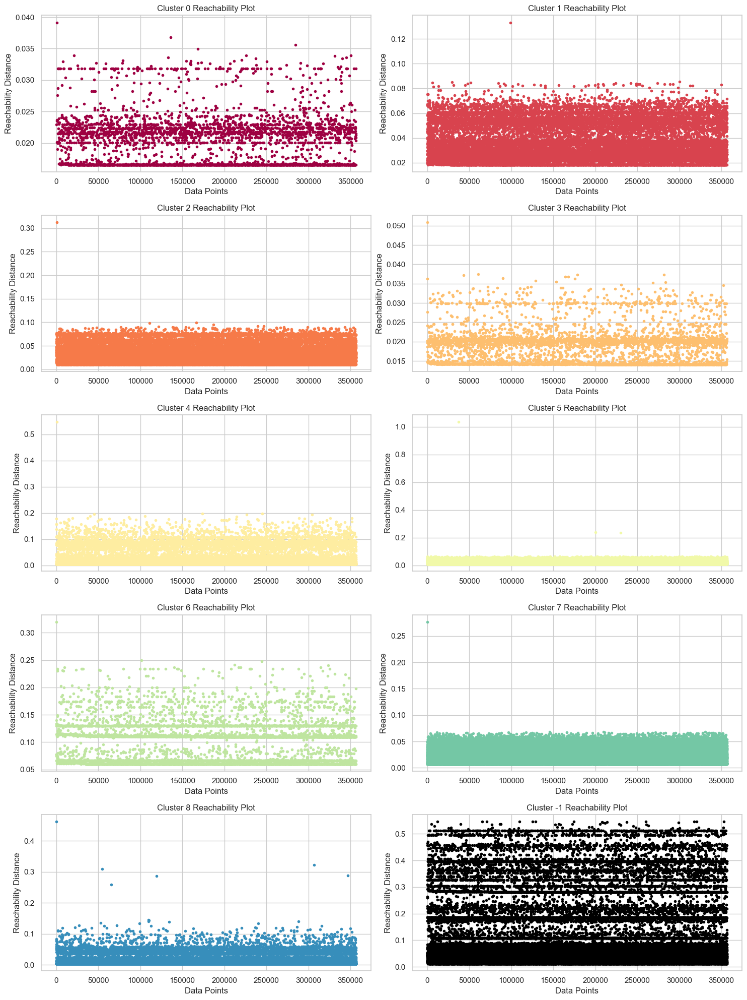

In [45]:
# Load your reachability and labels data
reachability = np.load('optics_reachability.npy')  
labels = np.load('optics_labels.npy')

# Identify unique labels and their counts
unique_labels = set(labels)

# Sort labels in their natural order, treating -1 (noise) separately
sorted_labels = sorted(unique_labels - {-1}) + ([-1] if -1 in unique_labels else [])

# Select the top 10 clusters for display (including noise if present)
N = 10  # Number of clusters to display
display_labels = sorted_labels[:N]

# Create subplots for the top N clusters in a 5x2 grid
fig, axs = plt.subplots(5, 2, figsize=(15, 20))
axs = axs.flatten()  # Flatten the 2D array of axes for easy iteration
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

for ax, cluster, color in zip(axs, display_labels, colors):
    if cluster == -1:
        color = (0, 0, 0, 1)  # Black used for noise
    class_member_mask = (labels == cluster)
    ax.plot(np.arange(len(reachability))[class_member_mask], reachability[class_member_mask], '.', color=color)
    ax.set_title(f'Cluster {cluster} Reachability Plot')
    ax.set_xlabel('Data Points')
    ax.set_ylabel('Reachability Distance')

plt.tight_layout()
# Save the plot to a JPG file
plt.savefig('reachability_plot.jpg', dpi=300)
plt.show()

The following statistics table provides a summary of the distinct count of several attributes within each cluster identified by the OPTICS algorithm. Here's how to interpret the output:

1. Area: The 'area' column shows the number of unique areas where crimes occurred within each cluster. Since all clusters, including noise (Cluster -1), have 21, this indicates that crimes in each cluster are spread across the same number of areas. This suggests that the clustering didn't separate crimes based on geographic location alone.
2. Crime Type (crm_cd): The 'crm_cd' column reflects the number of unique crime types in each cluster. Most clusters have all 20 crime types, indicating a diversity of crime types within each cluster. However, some clusters have fewer (like Cluster 3, with 17 types), which might suggest a slight specialization or prevalence of certain crime types in those clusters.
3. Weekday: The 'weekday_name' column indicates that crimes occurred on every day of the week within each cluster since the count is 7 for all. This suggests that the clustering is not based on the day of the week the crime occurred.
4. Time Category: The 'time_category' has three unique values overall, but some clusters only show 1 or 2 unique time categories. This means that certain clusters are composed of crimes that occur more frequently during specific times of the day.
4. Location: The 'location' column shows the count of unique locations where crimes occurred within each cluster. The variety in the number of locations across clusters suggests that some clusters are more localized (fewer unique locations), while others are more dispersed (more unique locations).
5. Size: The 'size' column shows the number of occurrences in each cluster. Cluster -1, which represents noise or anomalies, has the highest count, indicating a large number of crime incidents didn't fit well into the structured clusters.

Benefits and Insights:

- Cluster Characteristics: By looking at the unique counts and sizes, we can characterize each cluster. For example, a cluster with a high number of unique locations but a low number of crimes might indicate dispersed but infrequent criminal activity.
- Resource Allocation: Law enforcement can use this information to allocate resources more effectively. Clusters with higher crime counts or specific crime types might need more attention.
- Pattern Recognition: Identifying clusters with a high number of unique crime types could indicate areas prone to a variety of criminal activities, whereas clusters with fewer crime types might be targeted for specific crime prevention strategies.
- Time-Based Analysis: Clusters differentiated by time categories can help in understanding patterns at different times of the day, which is crucial for time-specific crime prevention efforts.
- Geographical Spread: Understanding the geographical spread of crimes within clusters can inform patrol strategies and community policing initiatives.

In sum, these statistics help in understanding the landscape of criminal activity, identifying patterns and anomalies, and enabling informed decisions to enhance public safety.

In [46]:
# Join Labels with original filtered_df
formatted_labels = ["Cluster " + str(label) for label in labels]

# Assign the formatted labels to the Original DataFrame
final_df['cluster_label'] = formatted_labels

stats= pd.DataFrame(final_df.groupby('cluster_label')
                    ['area', 'crm_cd', 'weekday_name', 'time_category', 'location'].nunique())
stats['size']= final_df.groupby('cluster_label')['area'].size()
final_df.to_csv('final_df.csv', index= None)
display (stats)

,area,crm_cd,weekday_name,time_category,location,size
cluster_label,,,,,,
Cluster -1,21,20,7,3,21866,59376
Cluster 0,21,18,7,1,3531,4281
Cluster 1,21,20,7,1,15494,29791
Cluster 2,21,20,7,1,17081,34235
Cluster 3,21,17,7,1,4377,5377
Cluster 4,21,20,7,2,16818,33741
Cluster 5,21,20,7,1,25236,65735
Cluster 6,21,20,7,1,4207,8401
Cluster 7,21,20,7,1,26927,71935


## Example Cluster Analysis
Let’s subset the dataset to only those included in ‘Cluster 1’, and run some explanatory analysis.

The image below created to answer the question "What are the Types of Crimes in Cluster 1" as itshows the frequency of various crime types within the Cluster 1. Here's how to interpret it:
1.	Cluster-Specific Crime Patterns: This chart represents the distribution of different crime types within 'Cluster 1', one of the groups identified by the clustering process. The bar lengths represent the count of each crime type, and they are arranged in descending order.
2.	Most and Least Common Crimes: The chart highlights which crimes are most and least common within the cluster. For instance, 'ASSAULT' (presumably simple assault) appears to be the most common crime, with over 5000 occurrences, while crimes like 'VEHICLE STOLEN' are much rarer, with only 10 instances.
3.	Comparison Within Cluster: By looking at the count of each crime type, you can compare the prevalence of different crimes within this cluster. This may indicate specific crime trends or patterns that are characteristic of 'Cluster 1'.
4.	Insight for Resource Allocation: Such a chart can help law enforcement or other stakeholders to understand the crime focus within this cluster. For example, resources can be allocated efficiently to address the most common crimes, like assault, since they are a prominent issue within this cluster.
5.	Understanding Cluster Demographics: If 'Cluster 1' is defined by certain demographic or geographic features (which is not depicted in the chart but may be known through the clustering process), this chart helps to understand the types of crimes that are most prevalent in those areas or among those populations.
6.	Tailoring Prevention and Response: Knowing the most common crime types in 'Cluster 1' enables targeted crime prevention initiatives, tailored community awareness programs, and specific training for law enforcement.
In the context of clustering, this visualization aids in understanding what makes 'Cluster 1' distinct regarding crime patterns. It could potentially reveal unique characteristics that define this group, which may be different from the patterns seen in other clusters.


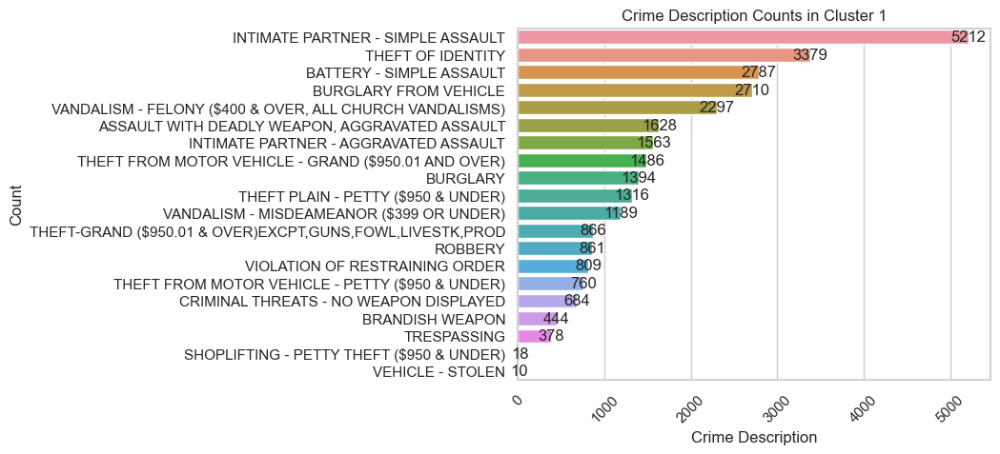

In [47]:
cluster_1 = final_df[final_df.cluster_label == 'Cluster 1']
cluster_1['crm_cd_desc_str'] = cluster_1['crm_cd_desc'].astype(str)

# Calculate counts and sort in descending order
order = cluster_1['crm_cd_desc_str'].value_counts().index

# Create the countplot using the string column with the specified order
ax = sns.countplot(data=cluster_1, y='crm_cd_desc_str', order=order)

# Improve plot aesthetics
plt.xticks(rotation=45)  # Rotate labels for better readability
plt.xlabel('Crime Description')
plt.ylabel('Count')
plt.title('Crime Description Counts in Cluster 1')

# Add count annotations to each bar
for p in ax.patches:
    width = p.get_width()
    ax.text(width + 3, p.get_y() + p.get_height()/2, 
            int(width), ha='center', va='center')
# Save the plot to a JPG file
plt.savefig('c101.jpg', dpi=300)
plt.show()

This second image is used to show the frequency of crimes across two dimensions: crime codes (types) and days of the week. Here's how to interpret it:
1.	Crime Codes: Each column represents a different crime type expressed by its code. 
2.	Days of the Week: Each row represents a day of the week, starting with Monday and ending with Sunday. 
3.	Color Intensity: The color intensity in each cell indicates the frequency of crimes for a particular code on a given day. Darker colors represent a higher number of crimes, while lighter colors represent fewer crimes.
4.	Annotations: Each cell has a number that specifies the exact count of crimes for that day and crime code.
5.	Patterns and Trends: The heatmap makes it easier to spot patterns. For example, if a particular crime code has consistently darker cells across the days, it suggests that type of crime occurs frequently every day. On the other hand, if a dark cell appears sporadically, it might suggest that the crime type has a day-specific pattern.
6.	Cluster-Specific Insights: Since this heatmap is for "Cluster 1", it highlights the crime trends specific to this group. It's useful for understanding what distinguishes this cluster from others, which may be useful for targeted policing or community support programs.
7.	Resource Planning: Law enforcement and community organizations can use this data to plan resources effectively. For example, if certain crimes spike on specific days, additional measures can be taken in anticipation.
8.	Community Awareness: The heatmap can be used to raise awareness in the community about the most common crimes on specific days, encouraging vigilance and preventive measures.
In summary, this heatmap provides a visual summary of crime frequencies within a specific cluster, offering valuable insights into daily and weekly crime patterns that can inform decision-making and resource allocation.


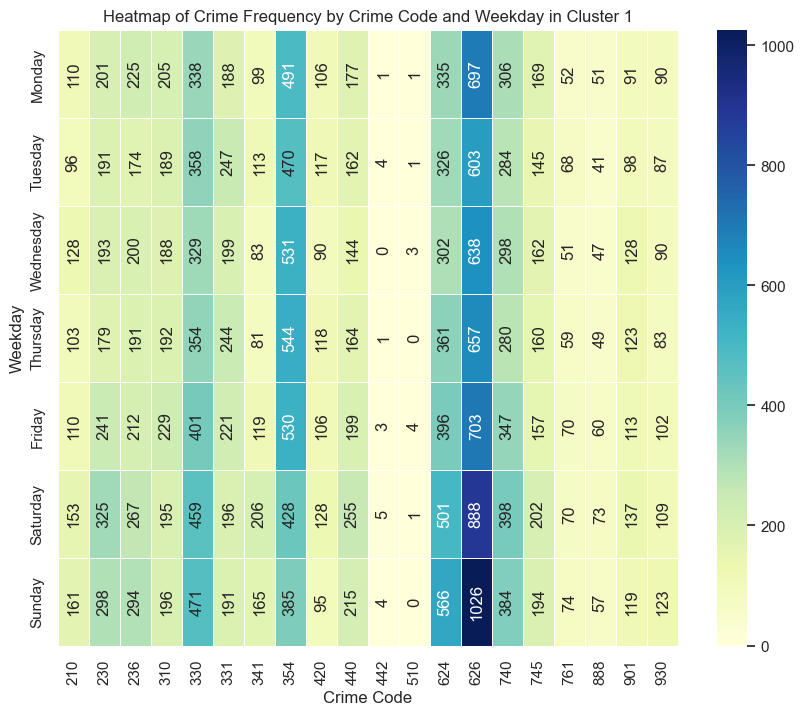

In [48]:
# Aggregate the data
crime_counts = cluster_1.groupby(['crm_cd', 'weekday_name']).size().reset_index(name='counts')

# Define the correct order for days of the week
weekdays = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Ensure that the DataFrame's 'weekday_name' is in the correct order
crime_counts['weekday_name'] = pd.Categorical(crime_counts['weekday_name'], categories=weekdays, ordered=True)

# Sort the DataFrame based on 'weekday_name'
crime_counts = crime_counts.sort_values('weekday_name')

# Pivot the data for the heatmap
pivot_table = crime_counts.pivot('weekday_name', 'crm_cd', 'counts')

# Create the heatmap
plt.figure(figsize=(10, 8))
ax= sns.heatmap(pivot_table, fmt="d", cmap='YlGnBu', linewidths=.5, annot=True)

# Rotate annotation text
for text in ax.texts:
    text.set_rotation(90)
    
# Enhance the plot
plt.title('Heatmap of Crime Frequency by Crime Code and Weekday in Cluster 1')
plt.ylabel('Weekday')
plt.xlabel('Crime Code')
plt.xticks(rotation=90)
# Save the plot to a JPG file
plt.savefig('c102.jpg', dpi=300)
plt.show()

This third image is used to show the Crime Frequency by Time Category and Weekday in Cluster 1. Here's how to interpret it:
1.	Axis Explanation: The y-axis (vertical) represents days of the week. The x-axis (horizontal) represents a single 'time category', which in this context is 'night' and it means that most of the crimes in Cluster 1 are accruing between midnight and 6:00 AM .
2.	Color Gradient: The intensity of the color indicates the frequency of crimes. Lighter colors represent fewer crimes, while darker colors represent more crimes.
3.	Annotated Numbers: The numbers in each cell provide the exact count of crimes that occurred in the specified time category on each day.
4.	Weekday Trends: The darkest cells are on Saturday and Sunday, indicating that these days have the highest number of crimes reported at night in Cluster 1.
5.	Cluster-Specific Activity: Since this heatmap is specific to Cluster 1, the implication is that for this particular group of data (which could be a specific area, demographic, or other common factor), nighttime crime is more frequent on the weekends.
6.	Actionable Insights: Such a heatmap can guide decisions for resource allocation, such as increasing police patrols or community programs on days with higher crime frequencies, especially over the weekend nights.
7.	Simplifying Complexity: This visualization simplifies complex data into an easily interpretable format, helping non-technical audiences understand patterns in crime occurrence related to time without needing to delve into raw numbers or spreadsheets.
This heatmap serves as a valuable tool for stakeholders to visualize and understand when crimes are most likely to occur within Cluster 1, which can be pivotal for planning and preventative measures.

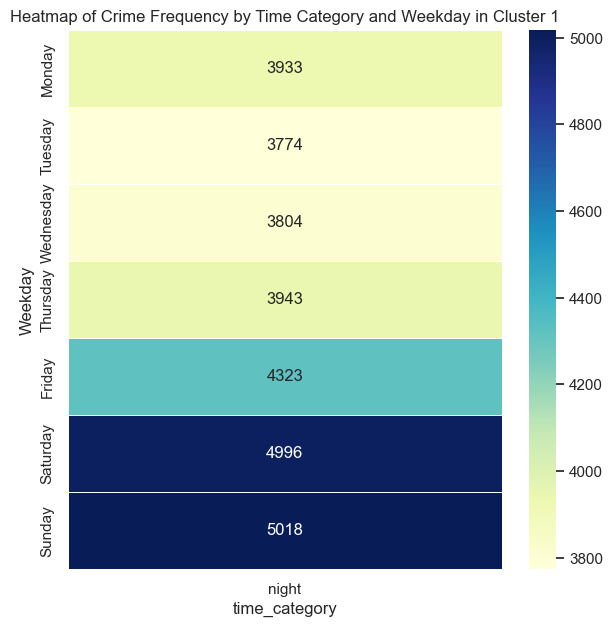

In [49]:
# Aggregate the data
crime_counts = cluster_1.groupby(['time_category', 'weekday_name']).size().reset_index(name='counts')

# Define the correct order for days of the week
weekdays = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Ensure that the DataFrame's 'weekday_name' is in the correct order
crime_counts['weekday_name'] = pd.Categorical(crime_counts['weekday_name'], categories=weekdays, ordered=True)

# Sort the DataFrame based on 'weekday_name'
crime_counts = crime_counts.sort_values('weekday_name')

# Pivot the data for the heatmap
pivot_table = crime_counts.pivot('weekday_name','time_category', 'counts')

# Create the heatmap
plt.figure(figsize=(7, 7))
ax= sns.heatmap(pivot_table, fmt="d", cmap='YlGnBu', linewidths=.5, annot=True)

# Enhance the plot
plt.title('Heatmap of Crime Frequency by Time Category and Weekday in Cluster 1')
plt.ylabel('Weekday')
plt.xlabel('time_category')
# Save the plot to a JPG file
plt.savefig('c103.jpg', dpi=300)
plt.show()

Now since we have a good idea about **WHAT** type of crime and **WHEN** it is mostly occurring, the final step is to illustrate **WHERE** it is most likely occurring. The below interactive map illustrates the 15,494 locations where a crime is most likely taking place.

In [50]:
import folium

# The number of decimal places determines the precision of the binning
cluster_1['rounded_lat'] = cluster_1['lat'].round(3)
cluster_1['rounded_lon'] = cluster_1['lon'].round(3)

# Group by the rounded coordinates and count the occurrences
grouped_locations = cluster_1.groupby(['rounded_lat', 'rounded_lon']).size().reset_index(name='count')

# Create a map centered around Los Angeles
la_map = folium.Map(location=[34.0522, -118.2437], zoom_start=10)

# Add clustered points to the map
for idx, row in grouped_locations.iterrows():
    folium.CircleMarker([row['rounded_lat'], row['rounded_lon']],
                        radius=row['count'] / 10,  # Size proportional to count
                        color='blue',
                        fill=True,
                        fill_color='blue',
                        fill_opacity=0.7).add_to(la_map)

# Display the map
la_map

## Demographic Insights:
Delving beyond basic queries of 'what', 'when', and 'where', our clustering analysis offers profound insights into demographic and ethnographic patterns, particularly focusing on the characteristics of crime victims within specific clusters. For Cluster 1, our exploration dives into the nuances of victim profiles, encompassing gender, descent, and age.
### Key Findings:
1.	**Gender Dynamics:** Our first chart illustrates the gender distribution among victims, providing a clear visual representation. Notably, in Cluster 1, females emerge as the predominant group affected by the crime pattern under analysis.
2.	**Ethnic and Racial Background:** The second chart delves into the victims' ethnic and racial backgrounds, offering a window into the diversity or homogeneity of the impacted communities. Notably, the Hispanic, Latin, and Mexican demographics, labeled as category H, emerge as the most significantly affected group in this cluster. This is followed by the Black community, denoted as category B, and then the White demographic, represented by category W, among others.
3.	**Age Groups Affected:** The final chart in our series examines the age distribution of the victims, yielding insights critical for crafting age-specific preventative measures. This chart reveals that adults, particularly those aged 31 to 45, are the most affected group in Cluster 1. This is followed by individuals aged 19 to 30, then those in the 46 to 60 bracket, and subsequently the 61 to 70 age group. The oldest group, 71 and above, is affected to a lesser extent. Notably, minors under 18 years are absent from this cluster.
### Implications and Strategies:
These analytical visuals collectively paint a detailed picture of Cluster 1, empowering the LAPD to respond to and predict crime patterns with greater efficacy. Understanding the demographic composition of crime victims equips law enforcement and community leaders to foster safer and more adaptive environments. This data-driven approach is pivotal in developing targeted strategies that not only address current challenges but also proactively mitigate potential future incidents.


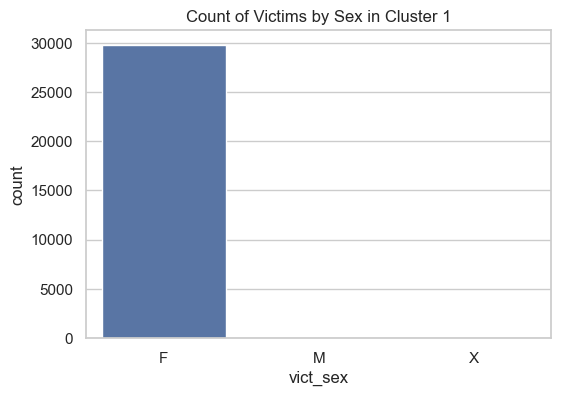

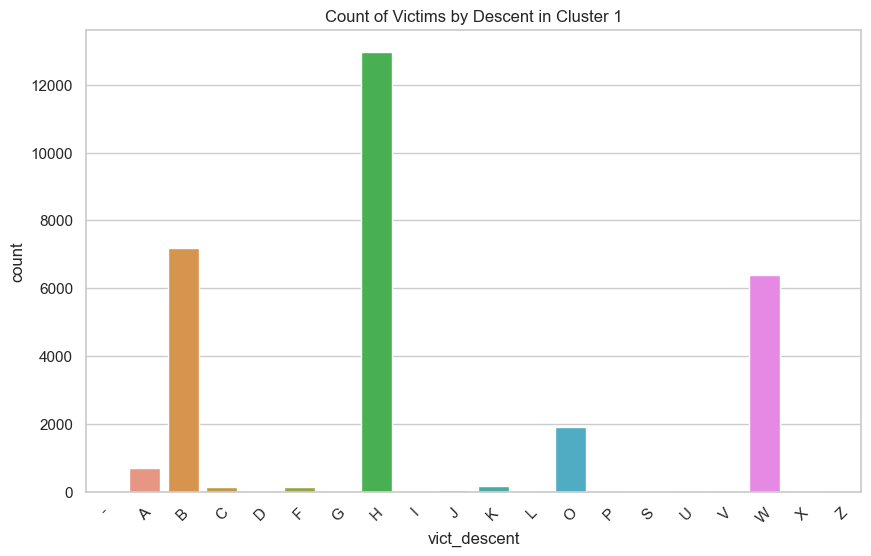

<Figure size 600x600 with 0 Axes>

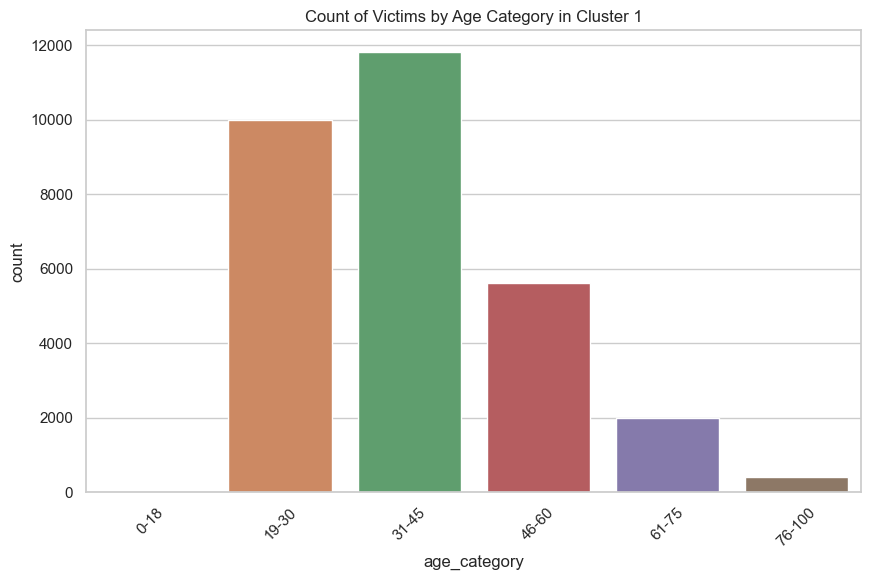

In [51]:
# Countplot for 'vict_sex'
plt.figure(figsize=(6, 4))
sns.countplot(data=cluster_1, x='vict_sex')
plt.title('Count of Victims by Sex in Cluster 1')
plt.show()

# Countplot for 'vict_descent'
plt.figure(figsize=(10, 6))
sns.countplot(data=cluster_1, x='vict_descent')
plt.title('Count of Victims by Descent in Cluster 1')
plt.xticks(rotation=45)  # Rotate labels for better readability
plt.show()


# Assuming 'vict_age' contains categorical data or has been binned into categories
plt.figure(figsize=(6, 6))
# Bin 'vict_age' into categories (example bins)
bins = [0, 18, 30, 45, 60, 75, 100]
labels = ['0-18', '19-30', '31-45', '46-60', '61-75', '76-100']
cluster_1['age_category'] = pd.cut(cluster_1['vict_age'], bins=bins, labels=labels, right=False)

plt.figure(figsize=(10, 6))
sns.countplot(data=cluster_1, x='age_category')
plt.title('Count of Victims by Age Category in Cluster 1')
plt.xticks(rotation=45)  # Rotate labels for better readability
plt.show()
